<a href="https://colab.research.google.com/github/Cristian28288/SyS/blob/main/TransformadaFourier_SAudio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Presente y describa el modelo que utiliza la FFT para el cálculo de los armónicos.**



**Descripción del modelo:**

1. Señal de Entrada:
*   Se parte de una señal de entrada que puede ser una función temporal (por ejemplo, una grabación de audio) representada en el dominio del tiempo. Esta señal puede contener una mezcla de múltiples frecuencias.






2.   Aplicación de la FFT:

*   La FFT se aplica a la señal de entrada. Este algoritmo eficiente convierte la señal del dominio del tiempo al dominio de la frecuencia. En términos más técnicos, la FFT calcula los coeficientes de la serie de Fourier discreta (DFT), que corresponden a las amplitudes y fases de las ondas sinusoidales que componen la señal original.






3.   Identificación de los Armónicos:


*   En el dominio de la frecuencia, los armónicos son las componentes que aparecen en múltiplos de la frecuencia fundamental (la frecuencia más baja presente en la señal). La frecuencia fundamental se encuentra como el pico de mayor energía en el espectro de frecuencia.
*   Los armónicos son entonces los picos sucesivos en múltiplos de esta frecuencia fundamental.





4.   Análisis de los Armónicos:

*   Se pueden analizar las amplitudes y fases de los armónicos para comprender las características de la señal original, como su timbre en el caso de señales musicales o las distorsiones en el caso de señales eléctricas.






**Aplicaciones Comunes:**

*   Análisis de Señales Eléctricas: En el análisis de sistemas eléctricos, los armónicos se analizan para identificar y mitigar distorsiones en la señal eléctrica.
*   Análisis de Audio: En la música, los armónicos determinan el timbre de los instrumentos, y su análisis es fundamental para la síntesis de sonidos y el procesamiento de señales de audio.




**Ventajas del Modelo:**

*   Eficiencia Computacional: La FFT es una versión optimizada de la DFT, lo que permite realizar cálculos rápidos incluso para señales de gran tamaño.
*   Descomposición Completa: Permite una descomposición completa de la señal en sus componentes de frecuencia, facilitando la identificación y análisis de los armónicos.



**Limitaciones:**

*   Resolución de Frecuencia: La resolución de frecuencia depende del tamaño de la ventana de tiempo analizada. Señales con componentes muy cercanas en frecuencia pueden no ser distinguibles si la resolución es baja.
*   Suposición de Periodicidad: La FFT supone que la señal es periódica dentro de la ventana de análisis, lo que puede introducir artefactos en señales no periódicas.



**Realice una comparación del tiempo de cómputo requerido para el cálculo de la transformada discreta de Fourier utilizado la estimación por sumatoria vs la FFT. Pruebe distintos valores de longitud de la señal de entrada (4,8,16,32,64,128,256,512,1024,2048,4096). Presente una gráfica comparativa de los tiempos de ejecución en segundos vs la longitud de la señal de entrada.**

| **Aspecto**                | **DFT**                                            | **FFT**                                              |
|---------------------------|----------------------------------------------------|------------------------------------------------------|
| **Complejidad**           | $$O(N^2)$$. | $$O(N \log N)$$                                    |
| **Descripción**           | Calculada mediante sumatoria directa, ineficiente para señales grandes. | Optimiza el cálculo con "divide y vencerás", eficiente para señales grandes. |
| **Aplicación**            | Adecuada para señales de longitud pequeña a moderada. | Preferida en procesamiento de señales y análisis de audio. |


Con esta comprensión teórica de las diferencias en complejidad y eficiencia entre la DFT por sumatoria y la FFT, podemos proceder a la simulación práctica para observar estas diferencias en acción.

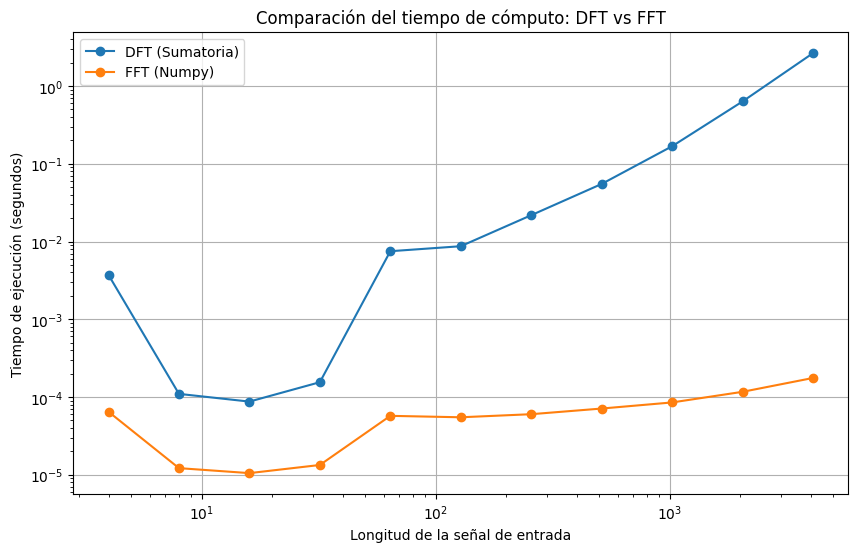

In [ ]:
import numpy as np
import time
import matplotlib.pyplot as plt

# Función para calcular la DFT usando la definición directa (sumatoria)
def dft_sum(signal):
    N = len(signal)
    n = np.arange(N)
    k = n.reshape((N, 1))
    M = np.exp(-2j * np.pi * k * n / N)
    return np.dot(M, signal)

# Función para calcular la FFT usando la función de numpy
def fft(signal):
    return np.fft.fft(signal)

# Valores de longitud de la señal de entrada a probar
lengths = [4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096]

# Arrays para almacenar los tiempos de cómputo
dft_times = []
fft_times = []

# Cálculo de los tiempos de cómputo para cada longitud de señal
for length in lengths:
    signal = np.random.random(length)

    # Tiempo para la DFT
    start_time = time.time()
    dft_sum(signal)
    dft_times.append(time.time() - start_time)

    # Tiempo para la FFT
    start_time = time.time()
    fft(signal)
    fft_times.append(time.time() - start_time)

# Graficar los resultados
plt.figure(figsize=(10, 6))
plt.plot(lengths, dft_times, label='DFT (Sumatoria)', marker='o')
plt.plot(lengths, fft_times, label='FFT (Numpy)', marker='o')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Longitud de la señal de entrada')
plt.ylabel('Tiempo de ejecución (segundos)')
plt.title('Comparación del tiempo de cómputo: DFT vs FFT')
plt.legend()
plt.grid(True)
plt.show()


**Implemente un filtro pasa bajas, un pasa altas, un pasa bandas, y un rechaza bandas utilizando la FFT y la iFFT sobre 5 segundos de su canción favorita de YouTube.**

In [ ]:
# Paso 1: Descargar el archivo de Google Drive
FILEID = "1e9ojrG6XWIuM24EJV83cbVn_BMCR69pi"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O Favorito.xlsx && rm -rf /tmp/cookies.txt

# Paso 2: Leer el archivo descargado
import pandas as pd
import numpy as np

file_ = 'Favorito.xlsx'
X  = pd.read_excel(file_)
print(X.head())  # Mostrar las primeras filas

# Paso 3: Instalar las librerías necesarias
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
!pip install soundfile

import os
import yt_dlp as youtube_dl
import subprocess

# Paso 4: Crear carpeta para resultados
try:
    os.mkdir('results')
except:
    print("Carpeta results ya existe")

# Paso 5: Descargar los videos y convertirlos a formato WAV
def download_ytvid_as_mp3(video_url, name):
    video_info = youtube_dl.YoutubeDL().extract_info(url=video_url, download=False)
    filename = f"{name}.mp3"
    options = {
        'format': 'bestaudio/best',
        'keepvideo': False,
        'outtmpl': filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print(f"Download complete: {filename}")

# Recorrer el archivo y descargar los videos
N, P = X.shape
for n in range(N):
    print(f"Video {n+1} de {N}")
    link = X.loc[n, 'link']
    band = X.loc[n, 'band']
    type_num = X.loc[n, 'type_num']

    name_ = f"results/{band}_{n}_{type_num}"
    download_ytvid_as_mp3(link, name_)

    # Convertir a WAV
    subprocess.call(['ffmpeg', '-y', '-i', f"{name_}.mp3", f"{name_}.wav"])


--2024-08-12 23:35:57--  https://docs.google.com/uc?export=download&confirm=&id=1e9ojrG6XWIuM24EJV83cbVn_BMCR69pi
Resolving docs.google.com (docs.google.com)... 173.194.216.100, 173.194.216.113, 173.194.216.101, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1e9ojrG6XWIuM24EJV83cbVn_BMCR69pi&export=download [following]
--2024-08-12 23:35:57--  https://drive.usercontent.google.com/download?id=1e9ojrG6XWIuM24EJV83cbVn_BMCR69pi&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.210.132, 2607:f8b0:400c:c0f::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.210.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9827 (9.6K) [application/octet-stream]
Saving to: ‘Favorito.xlsx’

Favorito.xlsx       100%[===================>]   9.60K  --

In [ ]:
!pip install scipy

In [ ]:
!pip install ipython

  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)


**Pasa bajos:**

In [ ]:
from scipy.io import wavfile
from scipy.signal import butter, lfilter
import numpy as np
import soundfile as sf
from IPython.display import Audio

# Función para aplicar un filtro pasa bajos
def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = lfilter(b, a, data)
    return y

# Función para leer, filtrar y guardar el archivo WAV
def apply_lowpass_filter(input_wav, output_wav, cutoff_freq, order=5):
    # Leer archivo WAV
    fs, data = wavfile.read(input_wav)

    # Si el audio es estéreo, convertirlo a mono sumando los canales
    if len(data.shape) == 2:
        data = np.mean(data, axis=1)

    # Aplicar el filtro pasa bajos
    filtered_data = butter_lowpass_filter(data, cutoff_freq, fs, order)

    # Guardar el resultado en un nuevo archivo WAV
    wavfile.write(output_wav, fs, np.int16(filtered_data))
    print(f"Archivo guardado: {output_wav}")

    return output_wav

# Función para extraer un segmento de 5 segundos de un archivo WAV
def extract_5_seconds(input_wav, output_wav, start_time=0, duration=5):
    # Leer archivo WAV
    data, samplerate = sf.read(input_wav)

    # Calcular el número de muestras para 5 segundos
    start_sample = int(start_time * samplerate)
    end_sample = int((start_time + duration) * samplerate)

    # Extraer el segmento de 5 segundos
    segment = data[start_sample:end_sample]

    # Guardar el segmento en un nuevo archivo WAV
    sf.write(output_wav, segment, samplerate)
    print(f"Segmento de 5 segundos guardado en: {output_wav}")

    return output_wav

# Ejemplo de uso dentro del bucle principal:
for n in range(N):
    print(f"Video {n+1} de {N}")
    link = X.loc[n, 'link']
    band = X.loc[n, 'band']
    type_num = X.loc[n, 'type_num']

    name_ = f"results/{band}_{n}_{type_num}"
    download_ytvid_as_mp3(link, name_)

    # Convertir a WAV
    subprocess.call(['ffmpeg', '-y', '-i', f"{name_}.mp3", f"{name_}.wav"])

    # Aplicar filtro de pasa bajos
    cutoff_freq = 3000  # Frecuencia de corte del filtro en Hz (ajusta según tus necesidades)
    output_wav = f"{name_}_lowpass.wav"
    filtered_wav = apply_lowpass_filter(f"{name_}.wav", output_wav, cutoff_freq)

    # Extraer y guardar 15 segundos desde el inicio del archivo filtrado
    output_wav_15s = f"{name_}_lowpass_15s.wav"
    segment_wav = extract_5_seconds(filtered_wav, output_wav_15s, start_time=0, duration=15)

    # Reproducir el segmento de 15 segundos
    display(Audio(segment_wav))

Video 1 de 1
[youtube] Extracting URL: https://youtu.be/ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[info] ZeAKGoNGcNs: Downloading 1 format(s): 251
[download] results/La Misma Gente_0_1.mp3 has already been downloaded
[download] 100% of    5.32MiB
Download complete: results/La Misma Gente_0_1.mp3
Archivo guardado: results/La Misma Gente_0_1_lowpass.wav
Segmento de 5 segundos guardado en: results/La Misma Gente_0_1_lowpass_15s.wav


**Pasa altos:**

In [ ]:
from scipy.io import wavfile
from scipy.signal import butter, lfilter
import numpy as np
import soundfile as sf
from IPython.display import Audio

# Función para aplicar un filtro pasa altos
def butter_highpass_filter(data, cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    y = lfilter(b, a, data)
    return y

# Función para leer, filtrar y guardar el archivo WAV
def apply_highpass_filter(input_wav, output_wav, cutoff_freq, order=5):
    # Leer archivo WAV
    fs, data = wavfile.read(input_wav)

    # Si el audio es estéreo, convertirlo a mono sumando los canales
    if len(data.shape) == 2:
        data = np.mean(data, axis=1)

    # Aplicar el filtro pasa altos
    filtered_data = butter_highpass_filter(data, cutoff_freq, fs, order)

    # Guardar el resultado en un nuevo archivo WAV
    wavfile.write(output_wav, fs, np.int16(filtered_data))
    print(f"Archivo guardado: {output_wav}")

    return output_wav

# Función para extraer un segmento de 5 segundos de un archivo WAV
def extract_5_seconds(input_wav, output_wav, start_time=0, duration=5):
    # Leer archivo WAV
    data, samplerate = sf.read(input_wav)

    # Calcular el número de muestras para 5 segundos
    start_sample = int(start_time * samplerate)
    end_sample = int((start_time + duration) * samplerate)

    # Extraer el segmento de 5 segundos
    segment = data[start_sample:end_sample]

    # Guardar el segmento en un nuevo archivo WAV
    sf.write(output_wav, segment, samplerate)
    print(f"Segmento de 5 segundos guardado en: {output_wav}")

    return output_wav

# Ejemplo de uso dentro del bucle principal:
for n in range(N):
    print(f"Video {n+1} de {N}")
    link = X.loc[n, 'link']
    band = X.loc[n, 'band']
    type_num = X.loc[n, 'type_num']

    name_ = f"results/{band}_{n}_{type_num}"
    download_ytvid_as_mp3(link, name_)

    # Convertir a WAV
    subprocess.call(['ffmpeg', '-y', '-i', f"{name_}.mp3", f"{name_}.wav"])

    # Aplicar filtro pasa altos
    cutoff_freq = 3000  # Frecuencia de corte del filtro en Hz (ajusta según tus necesidades)
    output_wav = f"{name_}_highpass.wav"
    filtered_wav = apply_highpass_filter(f"{name_}.wav", output_wav, cutoff_freq)

    # Extraer y guardar 15 segundos desde el inicio del archivo filtrado
    output_wav_15s = f"{name_}_highpass_15s.wav"
    segment_wav = extract_5_seconds(filtered_wav, output_wav_15s, start_time=0, duration=15)

    # Reproducir el segmento de 15 segundos
    display(Audio(segment_wav))

Video 1 de 1
[youtube] Extracting URL: https://youtu.be/ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[info] ZeAKGoNGcNs: Downloading 1 format(s): 251
[download] results/La Misma Gente_0_1.mp3 has already been downloaded
[download] 100% of    5.32MiB
Download complete: results/La Misma Gente_0_1.mp3
Archivo guardado: results/La Misma Gente_0_1_highpass.wav
Segmento de 5 segundos guardado en: results/La Misma Gente_0_1_highpass_15s.wav


**Pasa banda:**

In [ ]:
from scipy.io import wavfile
from scipy.signal import butter, lfilter
import numpy as np
import soundfile as sf
from IPython.display import Audio

# Función para aplicar un filtro pasa banda
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    y = lfilter(b, a, data)
    return y

# Función para leer, filtrar y guardar el archivo WAV
def apply_bandpass_filter(input_wav, output_wav, lowcut, highcut, order=5):
    # Leer archivo WAV
    fs, data = wavfile.read(input_wav)

    # Si el audio es estéreo, convertirlo a mono sumando los canales
    if len(data.shape) == 2:
        data = np.mean(data, axis=1)

    # Aplicar el filtro pasa banda
    filtered_data = butter_bandpass_filter(data, lowcut, highcut, fs, order)

    # Guardar el resultado en un nuevo archivo WAV
    wavfile.write(output_wav, fs, np.int16(filtered_data))
    print(f"Archivo guardado: {output_wav}")

    return output_wav

# Función para extraer un segmento de 5 segundos de un archivo WAV
def extract_5_seconds(input_wav, output_wav, start_time=0, duration=5):
    # Leer archivo WAV
    data, samplerate = sf.read(input_wav)

    # Calcular el número de muestras para 5 segundos
    start_sample = int(start_time * samplerate)
    end_sample = int((start_time + duration) * samplerate)

    # Extraer el segmento de 5 segundos
    segment = data[start_sample:end_sample]

    # Guardar el segmento en un nuevo archivo WAV
    sf.write(output_wav, segment, samplerate)
    print(f"Segmento de 5 segundos guardado en: {output_wav}")

    return output_wav

# Ejemplo de uso dentro del bucle principal:
for n in range(N):
    print(f"Video {n+1} de {N}")
    link = X.loc[n, 'link']
    band = X.loc[n, 'band']
    type_num = X.loc[n, 'type_num']

    name_ = f"results/{band}_{n}_{type_num}"
    download_ytvid_as_mp3(link, name_)

    # Convertir a WAV
    subprocess.call(['ffmpeg', '-y', '-i', f"{name_}.mp3", f"{name_}.wav"])

    # Aplicar filtro pasa banda
    lowcut = 500    # Frecuencia de corte baja en Hz
    highcut = 3000  # Frecuencia de corte alta en Hz
    output_wav = f"{name_}_bandpass.wav"
    filtered_wav = apply_bandpass_filter(f"{name_}.wav", output_wav, lowcut, highcut)

    # Extraer y guardar 15 segundos desde el inicio del archivo filtrado
    output_wav_15s = f"{name_}_bandpass_15s.wav"
    segment_wav = extract_5_seconds(filtered_wav, output_wav_15s, start_time=0, duration=15)

    # Reproducir el segmento de 15 segundos
    display(Audio(segment_wav))

Video 1 de 1
[youtube] Extracting URL: https://youtu.be/ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[info] ZeAKGoNGcNs: Downloading 1 format(s): 251
[download] results/La Misma Gente_0_1.mp3 has already been downloaded
[download] 100% of    5.32MiB
Download complete: results/La Misma Gente_0_1.mp3
Archivo guardado: results/La Misma Gente_0_1_bandpass.wav
Segmento de 5 segundos guardado en: results/La Misma Gente_0_1_bandpass_15s.wav


**Rechaza banda:**

In [ ]:
from scipy.io import wavfile
from scipy.signal import butter, lfilter
import numpy as np
import soundfile as sf
from IPython.display import Audio

# Función para aplicar un filtro rechaza banda
def butter_bandstop_filter(data, lowcut, highcut, fs, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='bandstop')
    y = lfilter(b, a, data)
    return y

# Función para leer, filtrar y guardar el archivo WAV
def apply_bandstop_filter(input_wav, output_wav, lowcut, highcut, order=5):
    # Leer archivo WAV
    fs, data = wavfile.read(input_wav)

    # Si el audio es estéreo, convertirlo a mono sumando los canales
    if len(data.shape) == 2:
        data = np.mean(data, axis=1)

    # Aplicar el filtro rechaza banda
    filtered_data = butter_bandstop_filter(data, lowcut, highcut, fs, order)

    # Guardar el resultado en un nuevo archivo WAV
    wavfile.write(output_wav, fs, np.int16(filtered_data))
    print(f"Archivo guardado: {output_wav}")

    return output_wav

# Función para extraer un segmento de 5 segundos de un archivo WAV
def extract_5_seconds(input_wav, output_wav, start_time=0, duration=5):
    # Leer archivo WAV
    data, samplerate = sf.read(input_wav)

    # Calcular el número de muestras para 5 segundos
    start_sample = int(start_time * samplerate)
    end_sample = int((start_time + duration) * samplerate)

    # Extraer el segmento de 5 segundos
    segment = data[start_sample:end_sample]

    # Guardar el segmento en un nuevo archivo WAV
    sf.write(output_wav, segment, samplerate)
    print(f"Segmento de 5 segundos guardado en: {output_wav}")

    return output_wav

# Ejemplo de uso dentro del bucle principal:
for n in range(N):
    print(f"Video {n+1} de {N}")
    link = X.loc[n, 'link']
    band = X.loc[n, 'band']
    type_num = X.loc[n, 'type_num']

    name_ = f"results/{band}_{n}_{type_num}"
    download_ytvid_as_mp3(link, name_)

    # Convertir a WAV
    subprocess.call(['ffmpeg', '-y', '-i', f"{name_}.mp3", f"{name_}.wav"])

    # Aplicar filtro rechaza banda
    lowcut = 500    # Frecuencia de corte baja en Hz
    highcut = 3000  # Frecuencia de corte alta en Hz
    output_wav = f"{name_}_bandstop.wav"
    filtered_wav = apply_bandstop_filter(f"{name_}.wav", output_wav, lowcut, highcut)

    # Extraer y guardar 15 segundos desde el inicio del archivo filtrado
    output_wav_15s = f"{name_}_bandstop_15s.wav"
    segment_wav = extract_5_seconds(filtered_wav, output_wav_15s, start_time=0, duration=15)

    # Reproducir el segmento de 15 segundos
    display(Audio(segment_wav))

Video 1 de 1
[youtube] Extracting URL: https://youtu.be/ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[info] ZeAKGoNGcNs: Downloading 1 format(s): 251
[download] results/La Misma Gente_0_1.mp3 has already been downloaded
[download] 100% of    5.32MiB
Download complete: results/La Misma Gente_0_1.mp3
Archivo guardado: results/La Misma Gente_0_1_bandstop.wav
Segmento de 5 segundos guardado en: results/La Misma Gente_0_1_bandstop_15s.wav


**Diseñe e implemente un detector de género musical, que permita diferenciar entre tres tipos de género. Para ello, construya una base de datos con al menos 30 registros por género musical, de 5 segundos cada uno, y luego implemente un código que permita recibir un nuevo registro músical de 5 segundos para detectar el género de la canción a partir de la distancia Euclídea entre la magnitud del espectro de Fourier del nuevo registro, y las magnitudes de los espectros de la base de datos construida.**

In [ ]:
#cargar datos desde drive acceso libre
FILEID = "1PtQu0byz1it3il0hi2r6beIGHP_hAtPX"

!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O  canciones.xlsx && rm -rf /tmp/cookies.txt
#!unzip -o codigos.zip
!dir

--2024-08-12 22:18:52--  https://docs.google.com/uc?export=download&confirm=&id=1PtQu0byz1it3il0hi2r6beIGHP_hAtPX
Resolving docs.google.com (docs.google.com)... 173.194.216.113, 173.194.216.102, 173.194.216.101, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1PtQu0byz1it3il0hi2r6beIGHP_hAtPX&export=download [following]
--2024-08-12 22:18:52--  https://drive.usercontent.google.com/download?id=1PtQu0byz1it3il0hi2r6beIGHP_hAtPX&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.210.132, 2607:f8b0:400c:c0f::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.210.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13085 (13K) [application/octet-stream]
Saving to: ‘canciones.xlsx’

canciones.xlsx      100%[===================>]  12.78K  -

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_ = 'canciones.xlsx'#leer archivo xlsx con link, band, type
X  = pd.read_excel(file_)
X#imprimir filas iniciales

,link,band,type,type_num
0,https://www.youtube.com/watch?v=ZeAKGoNGcNs,La Misma Gente,Salsa,1
1,https://youtu.be/kVKjNrNYiDg,La Misma Gente,Salsa,1
2,https://youtu.be/Mq3LwKa_lYg,Tito Rojas,Salsa,1
3,https://youtu.be/c_41p7h7V3g,Roberto Roena,Salsa,1
4,https://youtu.be/krA4QNOpFbU,Adolescent's Orquesta,Salsa,1
5,https://youtu.be/gxlB1B9emDc,OscarDLeon,Salsa,1
6,https://youtu.be/_WVeEhPJcCg,\nEddie Santiago,Salsa,1
7,https://youtu.be/R70wWRqWU_c,Willie Colón,Salsa,1
8,https://youtu.be/HqximtGu4uo,Willie Colón,Salsa,1
9,https://youtu.be/kwCV6OZI5GM,Héctor Lavoe,Salsa,1


In [ ]:
#instalar librerias necesarias para descargar audios youtube
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
!pip install soundfile

import os
import yt_dlp as youtube_dl

#funcion para descargar mp3 desde youtube
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz (2.7 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl.metadata (5.5 kB)
  Using cached certifi-2024.7.4-py3-none-any.whl.metadata (2.2 kB)
  Using cached mutagen-1.47.0-py3-none-any.whl.metadata (1.7 kB)
  Using cached pycryptodomex-3.20.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.4 kB)
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached urllib3-2.2.2-py3-none-any.whl.metadata (6.4 kB)
  Using cached websockets-12.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.6 kB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (33 kB)
  Usin

In [ ]:
import subprocess
import os

#crear carpeta con resultados
try:
  os.mkdir('results')
except:
  print("Carpeta results ya existe")

#recorrer excel con videos
N, P = X.shape
Ns = N * 5 #cantidad de segmentos por cancion

for n in range(N):
    print(f"video {n+1} de {N}")
    print(f"link: {X.loc[n,'link']}\n")
    print(f"band: {X.loc[n,'band']}\n")
    print(f"type: {X.loc[n,'type']}\n")
    #ruta video n-th
    name_ = 'results/'+X.loc[n,'band']+"_"+str(n)+"_"+str(X.loc[n,'type_num']) # #video+nombre+tipo de genero musical
    #descargar mp3 desde youtube
    download_ytvid_as_mp3(X.loc[n,'link'],name_)
    #convertir a .wav
    subprocess.call(['ffmpeg','-y', '-i', name_+'.mp3',
                   name_+'.wav'])

Carpeta results ya existe
video 1 de 30
link: https://www.youtube.com/watch?v=ZeAKGoNGcNs

band: La Misma Gente

type: Salsa

[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=ZeAKGoNGcNs
[youtube] ZeAKGoNGcNs: Downloading webpage
[youtube] ZeAKGoNGcNs: Downloading ios player API JSON
[youtube] ZeAKGoNGcNs: Downloading web creator player API JSON
[youtube] ZeAKGoNGcNs: Downloading m3u8 information
[info] ZeAKGoNGcNs: Downloading 1 format(s): 251
[download] results/La Misma Gente_0_1.mp3 has already been downloaded
[download] 100% of    5.32MiB
Download complete... results/La Misma Gente_0_1.mp3
video 2 de 30
link: https://youtu.be/kVKjNrNYiDg

band: La Misma Gente

type: Salsa

[youtube] Extracting U

In [ ]:
#cargar .wavs y partir audios
#lista archivos .wav
path = 'results/'
wav_files = [f for f in os.listdir(path) if f.endswith('.wav')]
wav_files

['Rata Blanca_18_2.wav',
 'Rata Blanca_15_2.wav',
 'Mägo de Oz_23_2.wav',
 'Héctor Lavoe_9_1.wav',
 'Suprema Corte_14_1.wav',
 'Willie Colón_7_1.wav',
 'La Misma Gente_1_1.wav',
 'Tito Rojas_2_1.wav',
 'Aerosmith_20_2.wav',
 'Mägo de Oz_24_2.wav',
 'Willie Colón_8_1.wav',
 'Gilberto Santa Rosa_11_1.wav',
 'Tito Rojas_12_1.wav',
 'Josimar y su yambu_10_1.wav',
 'AKASH_29_2.wav',
 'Rata Blanca_17_2.wav',
 '\nEddie Santiago_6_1.wav',
 'R.E.M_22_2.wav',
 'OscarDLeon_5_1.wav',
 'Aerosmith_21_2.wav',
 'La Misma Gente_0_1.wav',
 'Rata Blanca_16_2.wav',
 'Caifanes_27_2.wav',
 "Adolescent's Orquesta_4_1.wav",
 'Kraken_25_2.wav',
 'Tito Rojas_13_1.wav',
 'Aerosmith_19_2.wav',
 'Roberto Roena_3_1.wav',
 'Kraken_26_2.wav',
 'Heroes Del Silencio_28_2.wav']

In [ ]:
!pip install soundfile #instalar sondfile

In [ ]:
import soundfile as sf # para instalar pip install soundfile
#leer archivos y crear np.array audios
fs = 48000
tl = np.array([40,50,60,70,80,90,100]) #puntos lectura
ts = 5 #t segmento
Ns = len(wav_files)*len(tl) #cantidad segmentos
x_t = np.zeros((Ns,int(ts*fs),2)) #Ns segmentos, cantidad de muestras, 2 canales (stereo)
label = np.zeros((Ns,1)) #vector tipo de genero
name_c = []
#leer archivos wav
i = 0
for name in wav_files:#lectura audio .wav
    x, fs = sf.read(path+name)
    for ti in tl: #segmentos de tiempo
        x_t[i] = x[int(fs*ti):int(fs*(ti+ts)),:]
        label[i] = int(name[-5]) #tipo de genero
        name_c += [name[:-6]]
        print(f"{i} lectura: {name}; segundo {ti}:{ti+ts}; tipo música {label[i]}")
        i+=1
x_t.shape

0 lectura: Rata Blanca_18_2.wav; segundo 40:45; tipo música [2.]
1 lectura: Rata Blanca_18_2.wav; segundo 50:55; tipo música [2.]
2 lectura: Rata Blanca_18_2.wav; segundo 60:65; tipo música [2.]
3 lectura: Rata Blanca_18_2.wav; segundo 70:75; tipo música [2.]
4 lectura: Rata Blanca_18_2.wav; segundo 80:85; tipo música [2.]
5 lectura: Rata Blanca_18_2.wav; segundo 90:95; tipo música [2.]
6 lectura: Rata Blanca_18_2.wav; segundo 100:105; tipo música [2.]
7 lectura: Rata Blanca_15_2.wav; segundo 40:45; tipo música [2.]
8 lectura: Rata Blanca_15_2.wav; segundo 50:55; tipo música [2.]
9 lectura: Rata Blanca_15_2.wav; segundo 60:65; tipo música [2.]
10 lectura: Rata Blanca_15_2.wav; segundo 70:75; tipo música [2.]
11 lectura: Rata Blanca_15_2.wav; segundo 80:85; tipo música [2.]
12 lectura: Rata Blanca_15_2.wav; segundo 90:95; tipo música [2.]
13 lectura: Rata Blanca_15_2.wav; segundo 100:105; tipo música [2.]
14 lectura: Mägo de Oz_23_2.wav; segundo 40:45; tipo música [2.]
15 lectura: Mägo 

(210, 240000, 2)

In [ ]:
from IPython.display import Audio #reproducir segmento
i = 10
Audio(x_t[i].T,rate=fs)

In [ ]:
#calculo de fourier
vf = np.fft.rfftfreq(x_t.shape[1],1/fs) #calculo vector de frecuencias
Xw = np.fft.rfft(x_t,axis=1).mean(axis=-1) #transformada rapida de Fourier para señal Real a lo largo del tiempo (axis=1) y se promedian los dos canales
Xw.shape

(210, 120001)

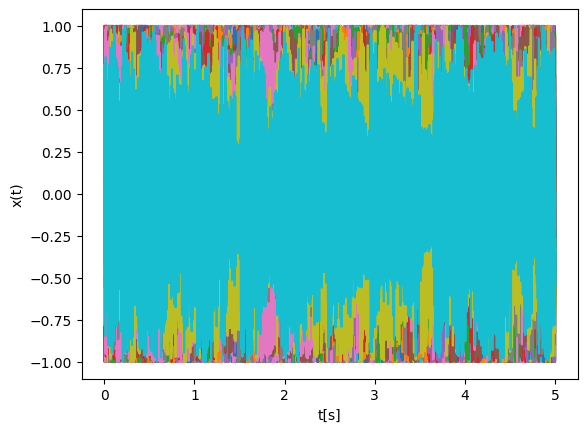

In [ ]:
#grafica tiempo y fourier
plt.plot(np.arange(0,ts,1/fs),x_t.mean(axis=-1).T) #se promedian los dos canales stereo
plt.xlabel('t[s]')
plt.ylabel('x(t)')
plt.show()

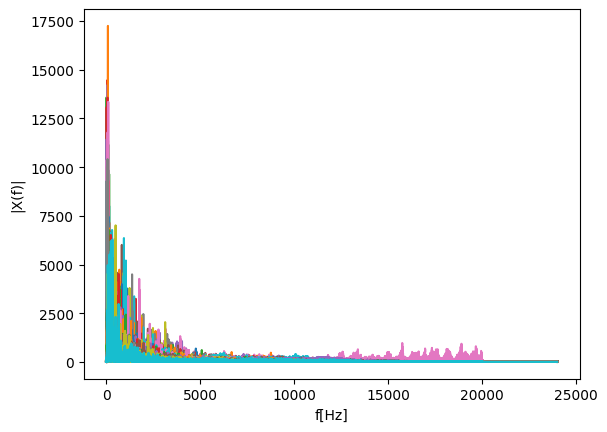

In [ ]:
plt.plot(vf,abs(Xw).T)
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)|')
plt.show()

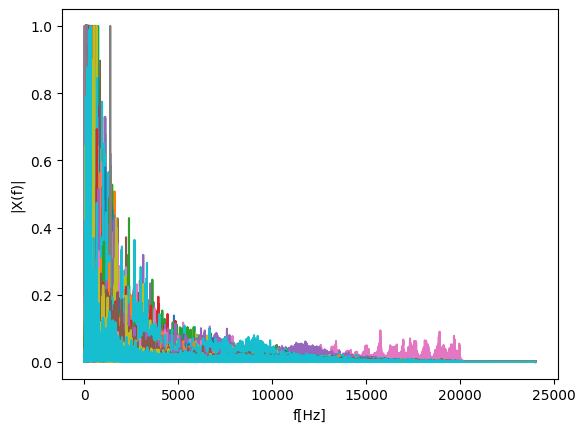

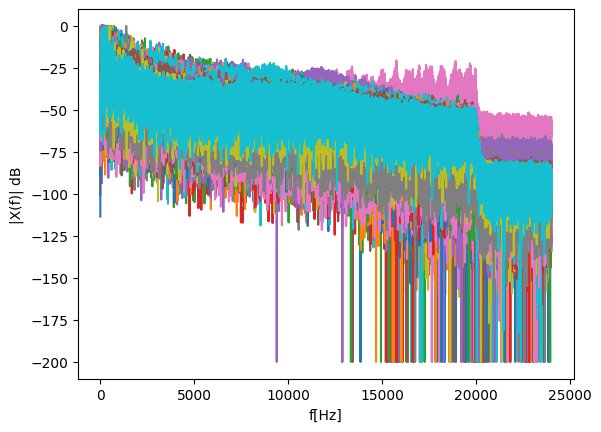

In [ ]:
#se normalizan espectros entre 0 y 1 para evitar inconsistencias por ampliltudes máximas
from sklearn.preprocessing import MinMaxScaler
sca = MinMaxScaler()
Xw_ = sca.fit_transform(abs(Xw).T).T

plt.plot(vf,Xw_.T)
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)|')
plt.show()

#en dB
plt.plot(vf,(20*np.log10(Xw_+1e-10)).T) # se suma 1e-10 para evitar discontinuidad del log
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)| dB')
plt.show()

Nota: Generalmente el espectro se presenta en decibeles [dB]

In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
#visualización de datos
red_ = TSNE(perplexity = 20,n_components=2,random_state=123,learning_rate='auto',init='pca')
#red_ = PCA(n_components=2,random_state=123)
fmax = 7000
X_2D = red_.fit_transform(Xw_[:,:fmax]) #se tiene en cuenta el espectro hasta fmax Hz

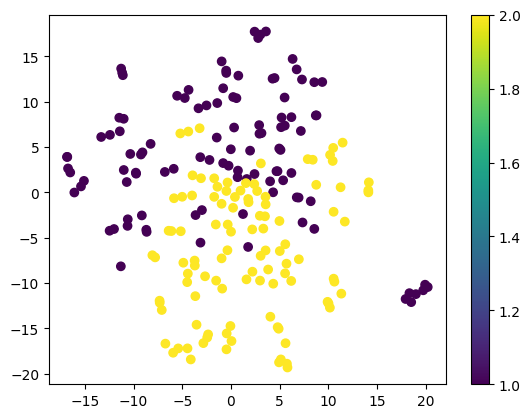

<ipython-input-28-6e94555dcd77>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.text(X_2D[i,0]*1.025,X_2D[i,1]*1.025, tex[:-2]+"_"+str(i), fontsize=6,color=color_[int(label[i]-1)])


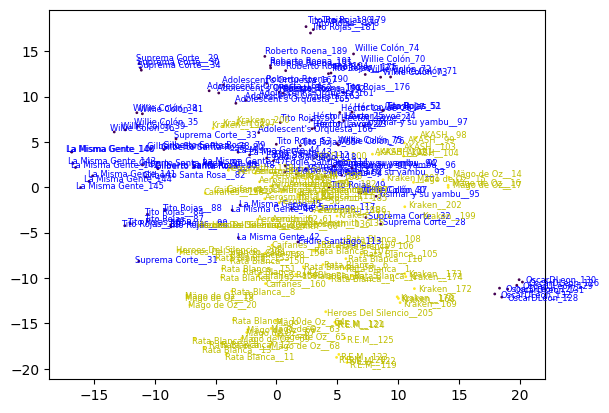

In [ ]:
#graficar separabilidad 2D
plt.scatter(X_2D[:,0],X_2D[:,1],c=label)
plt.colorbar()
plt.show()

color_ = ["b","y"]
#nombre cancion
plt.scatter(X_2D[:,0],X_2D[:,1],c=label,s=1)
for i, tex in enumerate(name_c):
    #print(f"{i} {tex}")
    plt.text(X_2D[i,0]*1.025,X_2D[i,1]*1.025, tex[:-2]+"_"+str(i), fontsize=6,color=color_[int(label[i]-1)])

#plt.colorbar()
plt.show()

In [ ]:
#reproducir audio
i = 96
Audio(x_t[i].T,rate=fs)

In [ ]:
i = 14
Audio(x_t[i].T,rate=fs)

In [ ]:
import joblib
#guardar modelo
os.mkdir('modelo')
filename_ = 'modelo/reggaeton_vs_metal'
model_ ={'Xw_':Xw_,'fmax': fmax, 'label' : label, 'name_c' : name_c, 'vf':vf,'fs':fs}
joblib.dump(model_,filename_+".pkl")

['modelo/reggaeton_vs_metal.pkl']

In [ ]:
#descargar modelo
#guardar resultados
from google.colab import files
from datetime import date, datetime
import shutil
#guardar resultados
namefile = str(datetime.now().strftime("%Y_%m_%d_%H_%M_%d"))+'modelo'
shutil.make_archive(namefile, 'zip', 'modelo')
files.download(namefile+'.zip')

#el archivo .zip puede cargarse en drive y utilizarse en otro cuaderno para detectar género musical de nuevos segmentos

In [ ]:
#cargar modelo
my_model_loaded = joblib.load(filename_+".pkl")
my_model_loaded.keys()